In [ ]:
# %%

#############################################################################
# 4 - NLP
#############################################################################

# !pip install pandas
# !pip install seaborn
# !pip install matplotlib
# !pip install wordcloud
# !pip install spacy
# !pip install sklearn
# !python -m spacy download pt_core_news_sm

In [2]:
# %% IMPORTANDO OS PACOTES

import random
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from collections import Counter

import spacy
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from scipy.sparse import hstack, csr_matrix

C:\Users\josee\anaconda3\Lib\site-packages\seaborn\_statistics.py:32: UserWarning: A NumPy version >=1.22.4 and <2.3.0 is required for this version of SciPy (detected version 2.3.2)
  from scipy.stats import gaussian_kde
C:\Users\josee\anaconda3\Lib\site-packages\h5py\__init__.py:36: UserWarning: h5py is running against HDF5 1.14.2 when it was built against 1.14.5, this may cause problems
  _warn(("h5py is running against HDF5 {0} when it was built against {1}, "


In [3]:
# %% INSTANCIANDO O SPACY E IMPORTANDO O BANCO DE DADOS

random.seed(30)
np.random.seed(30)

nlp = spacy.load("pt_core_news_md")

df = pd.read_csv("db.csv")

In [4]:
# %% AJUSTANDO O BANCO DE DADOS

df.drop(
    columns=[
        "user_name",
        "user_at",
        "user_url",
        "user_avatar_url",
        "images_url",
        "post_url",
    ],
    inplace=True,
)

df["text_raw"] = df["text_raw"].fillna("").astype(str)

In [5]:
# %% DEFININDO E ADICIONANDO STOPWORDS E OBJETO DE SUBSTITUIÇÕES

stopwords = nlp.Defaults.stop_words
new_stopwords = {"pra", "to", "ja", "ta", "so", "ai", "pro", "tao", "sera", "la"}
for word in new_stopwords:
    stopwords.add(word)

substitutions = {
    "vc": "você",
    "pq": "porque",
    "pque": "porque",
    "tbm": "também",
    "tb": "também",
    "blz": "beleza",
    "vcs": "vocês",
    "tô": "estou",
    "tá": "esta",
    "dnv": "de novo",
    "hj": "hoje",
    "pf": "por favor",
    "pfv": "por favor",
    "pra": "para",
}

In [6]:
# %% PRÉ-PROCESSAMENTO


# Tokenizando as palavras e fazendo substituições
def get_tokens(text):
    if not isinstance(text, str):
        return []
    new_text = " ".join(
        [substitutions.get(word, word) for word in text.lower().split()]
    )
    tokens = [
        token
        for token in nlp(new_text)
        if not token.is_punct and not token.is_space and token.is_alpha
    ]
    return tokens


df_tokens = pd.DataFrame()
df_tokens["tokens"] = df["text_raw"].apply(get_tokens)


# Retirando Stopwrds e gerando o texto lemmatizado
def preprocess_text_lemma(tokens):
    text = [token.lemma_ for token in tokens if not token.is_stop]
    return " ".join(text)


def preprocess_text_stop(tokens):
    text = [token.text for token in tokens]
    return " ".join(text)


df["text"] = df_tokens["tokens"].apply(preprocess_text_lemma)
df["text_stop"] = df_tokens["tokens"].apply(preprocess_text_stop)
df["text_list"] = df["text"].apply(
    lambda text: text.split() if isinstance(text, str) else []
)

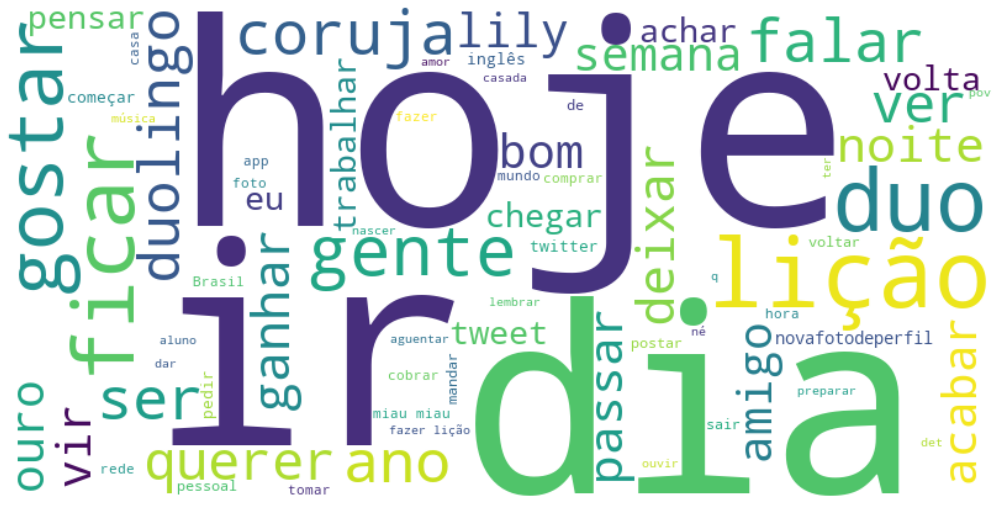

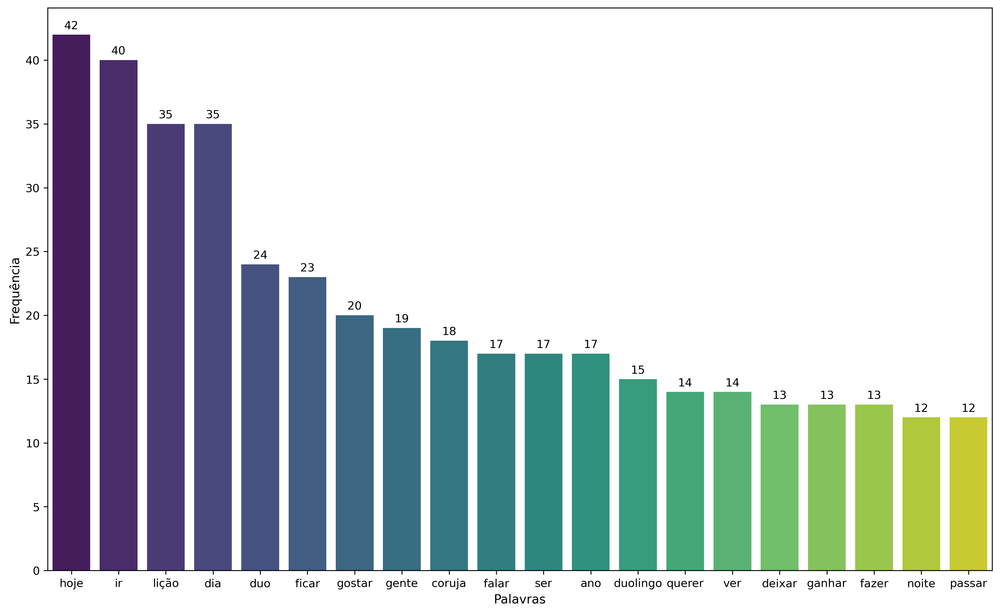

In [7]:
# %% PALAVRAS MAIS FREQUENTES (BAG OF WORDS)


def prepare_words_data(text_series):
    bag_of_words = " ".join(text_series)

    count_of_words = Counter(bag_of_words.split())

    words = [i[0] for i in count_of_words.most_common(20)]
    frequency = [i[1] for i in count_of_words.most_common(20)]
    return bag_of_words, words, frequency


def visualize_words_analysis(text_series):
    bag_of_words, words, frequency = prepare_words_data(text_series)

    wordcloud = WordCloud(
        width=800, height=400, background_color="white", min_font_size=10
    ).generate(bag_of_words)

    plt.figure(figsize=(15, 9), dpi=300, facecolor=None)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

    plt.figure(figsize=(15, 9), dpi=300)
    plot = sns.barplot(
        x=words,
        y=frequency,
        palette="viridis",
        hue=words,
        legend=False,
    )

    for container in plot.containers:
        plot.bar_label(container, padding=3, fontsize=10)

    plt.xlabel("Palavras", fontsize=11)
    plt.ylabel("Frequência", fontsize=11)
    plt.show()


visualize_words_analysis(df["text"])

In [19]:
# %% ANÁLISE DE PRIMEIRA E TERCEIRA PESSOA


def get_words_for_person(df, person: int = 1):
    words = [
        token.text
        for tokens in df
        for token in tokens
        if f"Person={person}" in token.morph or (token.text == "meu" and person == 1)
    ]
    return words


words_1_person = get_words_for_person(df_tokens["tokens"], 1)
words_3_person = get_words_for_person(df_tokens["tokens"], 3)


def visualize_person_distribution(person_1, person_3, df):
    n_words = 0
    for tokens in df:
        for token in tokens:
            n_words += 1

    n_person_1 = len(person_1)
    n_person_3 = len(person_3)
    n_words = n_words - (n_person_1 + n_person_3)
    plt.pie(
        [n_person_1, n_person_3, n_words],
        labels=[
            f"1 Pessoa, {n_person_1}",
            f"3 Pessoa, {n_person_3}",
            f"Demais palavras, {n_words}",
        ],
        autopct="%.0f%%",
    )
    plt.show()


# GERANDO A VARIÁVEL DE 1 PESSOA E 3 PESSOA


def count_person_usage(tokens):
    person_1, person_3 = 0, 0
    for token in tokens:
        if "Person=1" in token.morph:
            person_1 += 1
        elif token.text == "meu":
            person_1 += 1
        elif "Person=3" in token.morph:
            person_3 += 1
    return [person_1, person_3]


df["person"] = df_tokens["tokens"].apply(count_person_usage)

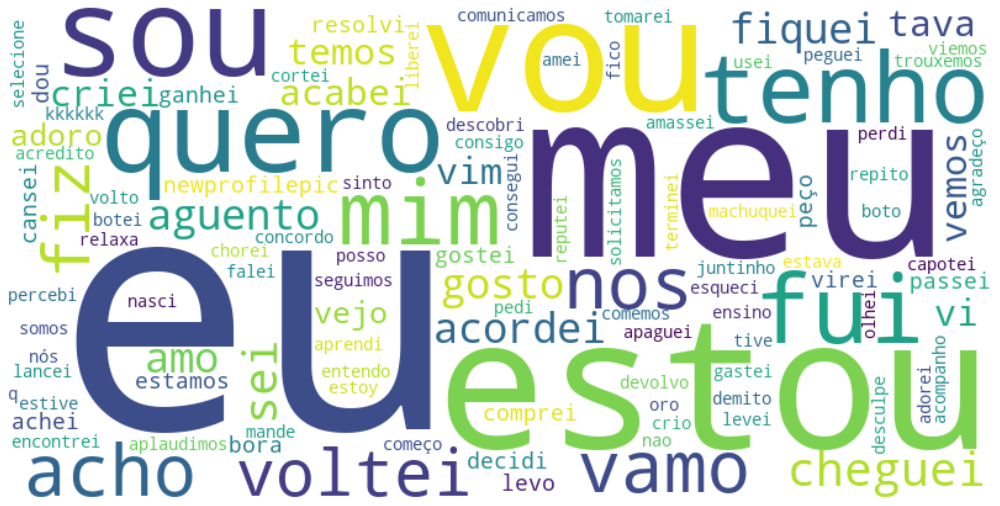

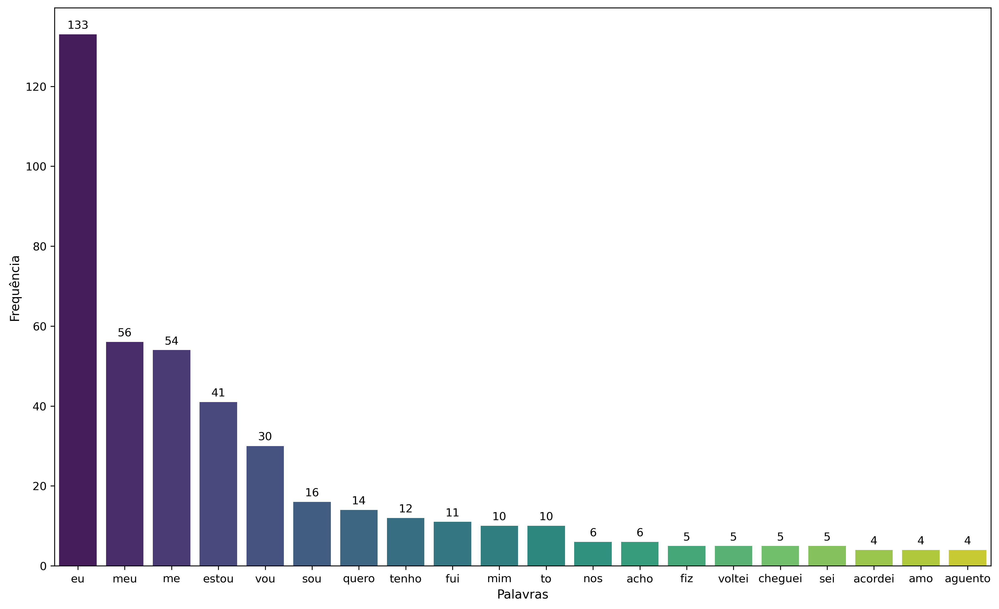

In [20]:
visualize_words_analysis(words_1_person)

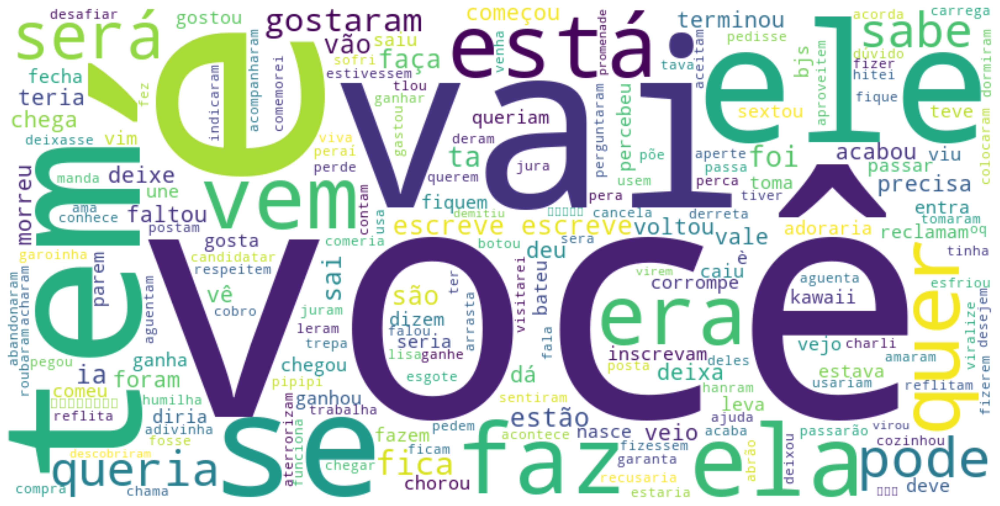

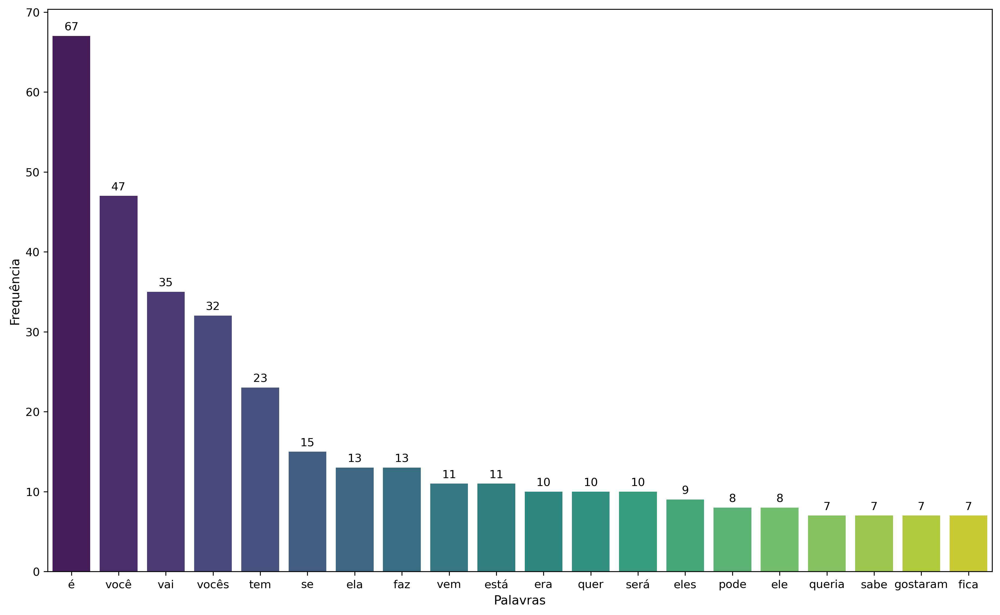

In [21]:
visualize_words_analysis(words_3_person)

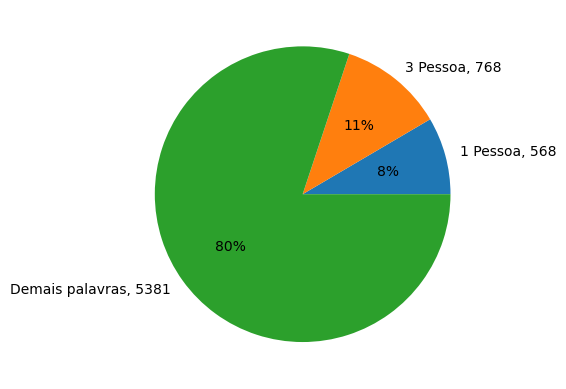

In [22]:
visualize_person_distribution(words_1_person, words_3_person, df_tokens["tokens"])

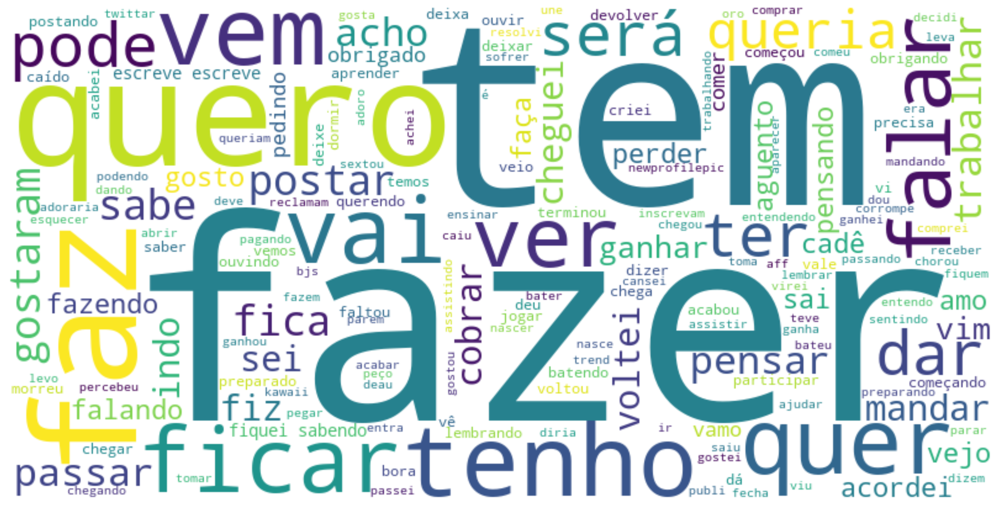

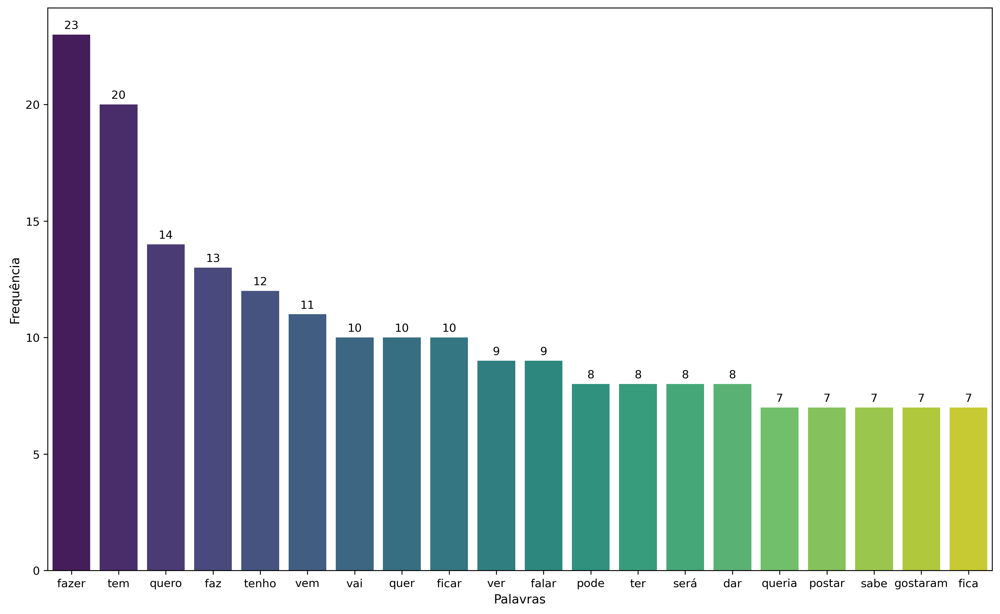

In [9]:
# %% ANÁLISE DE VERBOS


def get_verbs(df):
    verbs = [token.text for tokens in df for token in tokens if token.pos_ == "VERB"]
    return verbs


verbs = get_verbs(df_tokens["tokens"])

visualize_words_analysis(verbs)

In [10]:
# %% DEFININDO N-GRAMS


def get_ngram_frequencies(df, ngram, stopword=True):
    if not stopword:
        vectorizer = CountVectorizer(ngram_range=(ngram, ngram))
    else:
        vectorizer = CountVectorizer(
            ngram_range=(ngram, ngram), stop_words=list(stopwords)
        )

    X = vectorizer.fit_transform(df)

    feature_names = vectorizer.get_feature_names_out()

    df_ngram_counts = pd.DataFrame(X.toarray(), columns=feature_names)

    frequencies = df_ngram_counts.sum().sort_values(ascending=False)

    return frequencies


bigram_frequencies = get_ngram_frequencies(df["text"], 2)
trigram_frequencies = get_ngram_frequencies(df["text"], 3)


def get_ngram_frequencies_with_target(df, ngram, target):
    target_frequencies = get_ngram_frequencies(df, ngram, stopword=False)

    filtered = target_frequencies[
        target_frequencies.index.str.contains(rf"\b{target}\b")
    ]

    return filtered


target_ngram_frequencies = get_ngram_frequencies_with_target(df["text_stop"], 3, "eu")

In [15]:
# %% VISUALIZAÇÃO N-GRAMS


def visualize_ngram_analysis(frequencies, n_gram):
    plt.figure(figsize=(15, 9), dpi=300)
    plot = sns.barplot(
        x=frequencies.head(10).values,
        y=frequencies.head(10).index,
        palette="viridis",
        hue=frequencies.head(10).values,
        legend=False,
    )

    for container in plot.containers:
        plot.bar_label(container, padding=3, fontsize=10)

    plt.xlabel("Frequência", fontsize=11)
    plt.ylabel(f"{n_gram}", fontsize=11)
    plt.show()


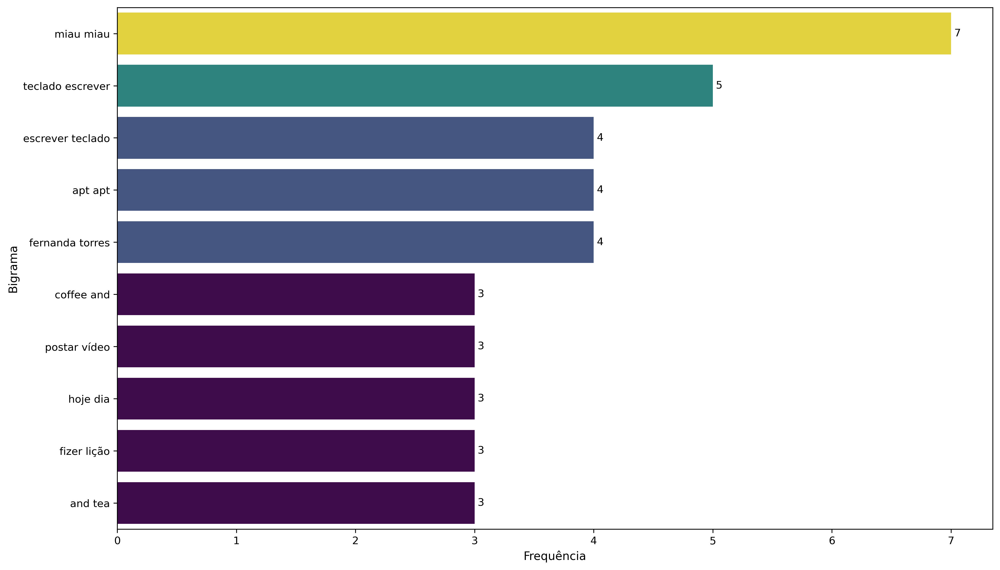

In [16]:
visualize_ngram_analysis(bigram_frequencies, "Bigrama")

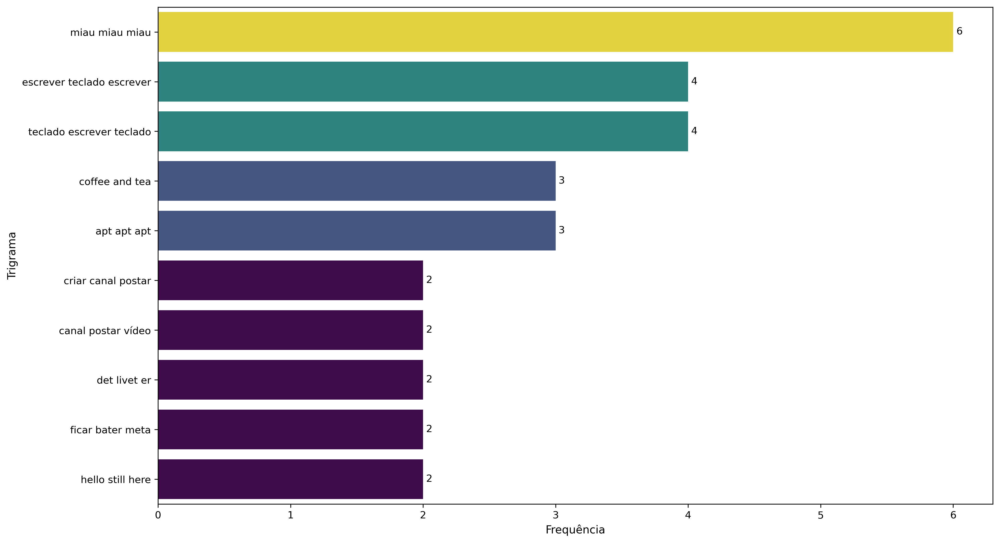

In [17]:
visualize_ngram_analysis(trigram_frequencies, "Trigrama")

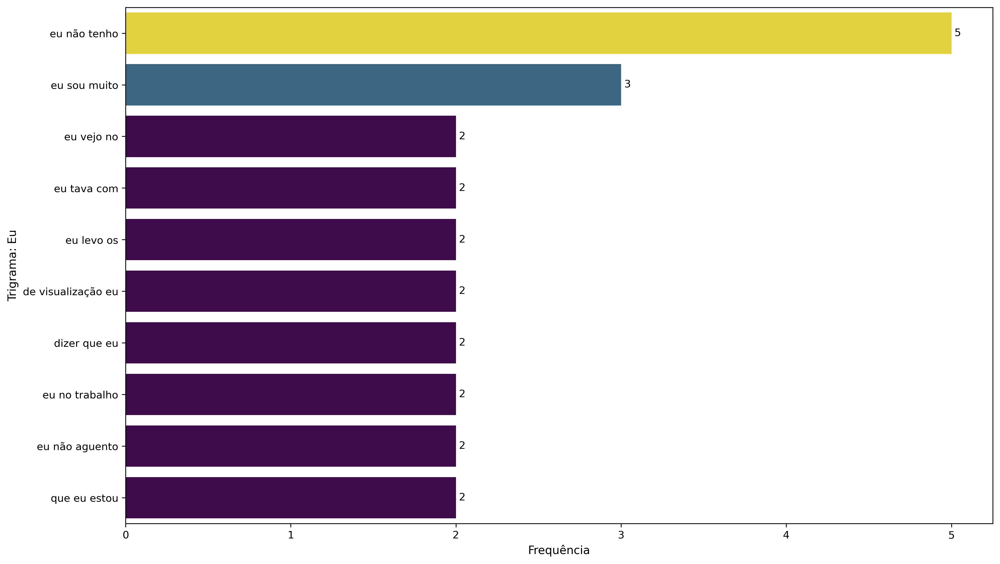

In [18]:
visualize_ngram_analysis(target_ngram_frequencies, "Trigrama: Eu")

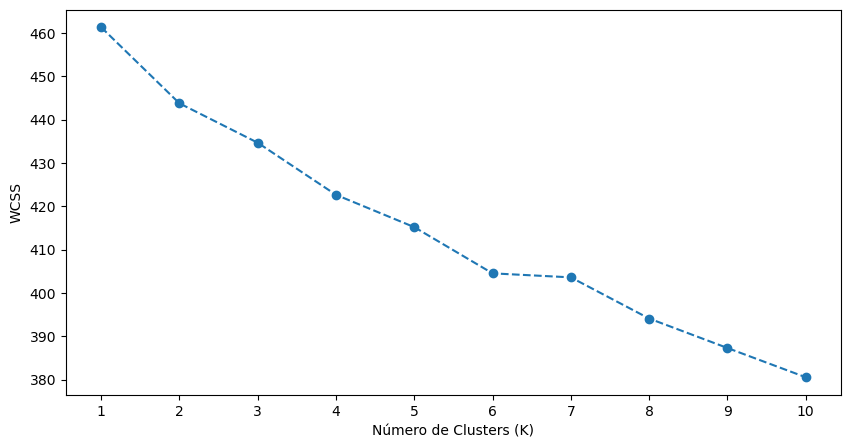

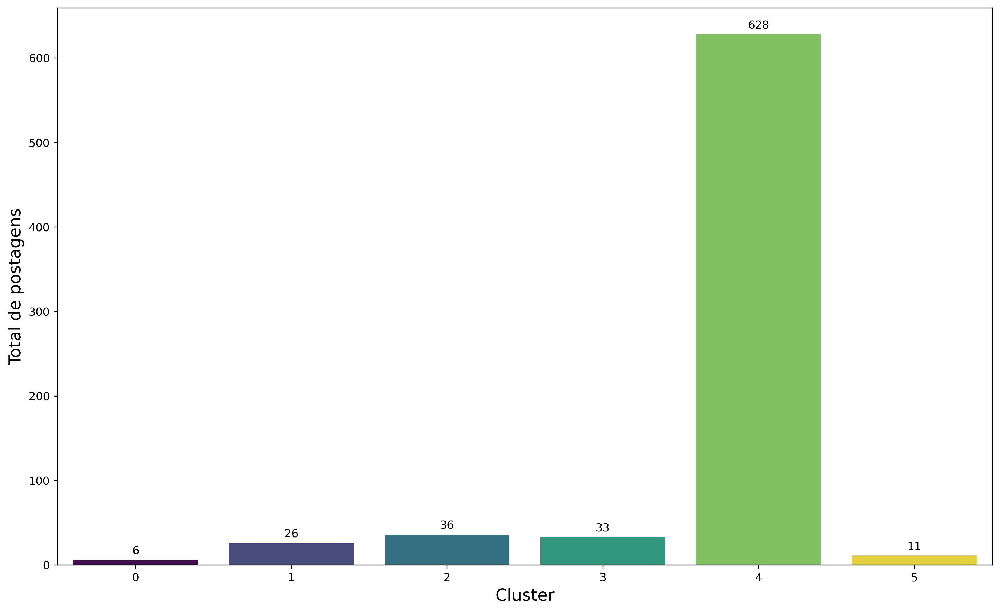

In [12]:
# %% VETOR E KMEANS SOMENTE TEXTO

vectorizer = TfidfVectorizer(max_features=1000, min_df=5, max_df=0.8)

X_tfidf = vectorizer.fit_transform(df["text"])


# MÉTODO DO COTOVELO PARA SABER QUANTOS CLUSTERS USAR
def elbow_method(X):
    wcss = []

    for i in range(1, 11):
        kmeans = KMeans(n_clusters=i, init="k-means++", max_iter=300, n_init=10)
        kmeans.fit(X)
        wcss.append(kmeans.inertia_)

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, 11), wcss, marker="o", linestyle="--")
    plt.xlabel("Número de Clusters (K)")
    plt.ylabel("WCSS")
    plt.xticks(range(1, 11))
    plt.show()


# CLUSTERIZANDO AS POSTAGENS
def perform_cluster_analysis(X, n_clusters):
    kmeans = KMeans(
        n_clusters=n_clusters,
        init="k-means++",
        max_iter=300,
        n_init=10,
        random_state=30,
    )
    df["cluster"] = kmeans.fit_predict(X)

    results = {}
    cluster_words_data = {}

    for cluster_id in sorted(df["cluster"].unique()):
        cluster_df = df[df["cluster"] == cluster_id]
        _, words, frequency = prepare_words_data(cluster_df["text"])

        cluster_words_data[cluster_id] = {
            "num_items": cluster_df.shape[0],
            "words": words,
            "frequency": frequency,
        }

    results["cluster_words_data"] = cluster_words_data

    # MÉDIA DE PALAVRAS EM 1 E 3 PESSOA POR CLUSTER
    df["person_1"] = df["person"].apply(lambda x: x[0])
    df["person_3"] = df["person"].apply(lambda x: x[1])

    person_1_avg = df.groupby("cluster")["person_1"].mean().to_dict()
    person_3_avg = df.groupby("cluster")["person_3"].mean().to_dict()

    results["person_1_avg"] = person_1_avg
    results["person_3_avg"] = person_3_avg

    # GRÁFICO - NÚMERO DE POSTAGENS POR CLUSTER
    plt.figure(figsize=(15, 9), dpi=300)
    plot = sns.barplot(
        data=df.groupby("cluster").count(),
        x="cluster",
        y="text",
        palette="viridis",
        hue="cluster",
        legend=False,
    )

    for container in plot.containers:
        plot.bar_label(container, padding=3, fontsize=10)

    plt.xlabel("Cluster", fontsize=15)
    plt.ylabel("Total de postagens", fontsize=15)
    plt.show()

    # WSS POR CLUSTER
    X_array = X.toarray()
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_

    wcss_for_cluster = []

    for i in range(kmeans.n_clusters):
        pontos = X_array[labels == i]
        centroide = centroids[i]
        wcss_i = np.sum((pontos - centroide) ** 2)
        wcss_for_cluster.append(wcss_i)

    results["wcss_for_cluster"] = wcss_for_cluster

    return results


elbow_method(X_tfidf)
text_clustering_results = perform_cluster_analysis(X_tfidf, 6)

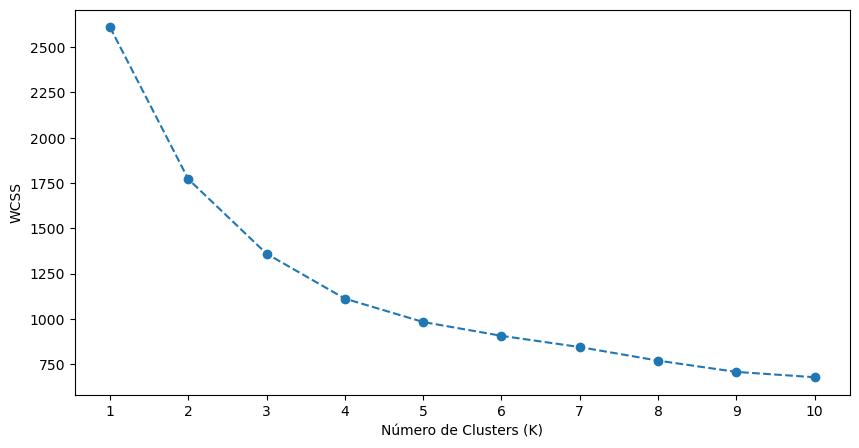

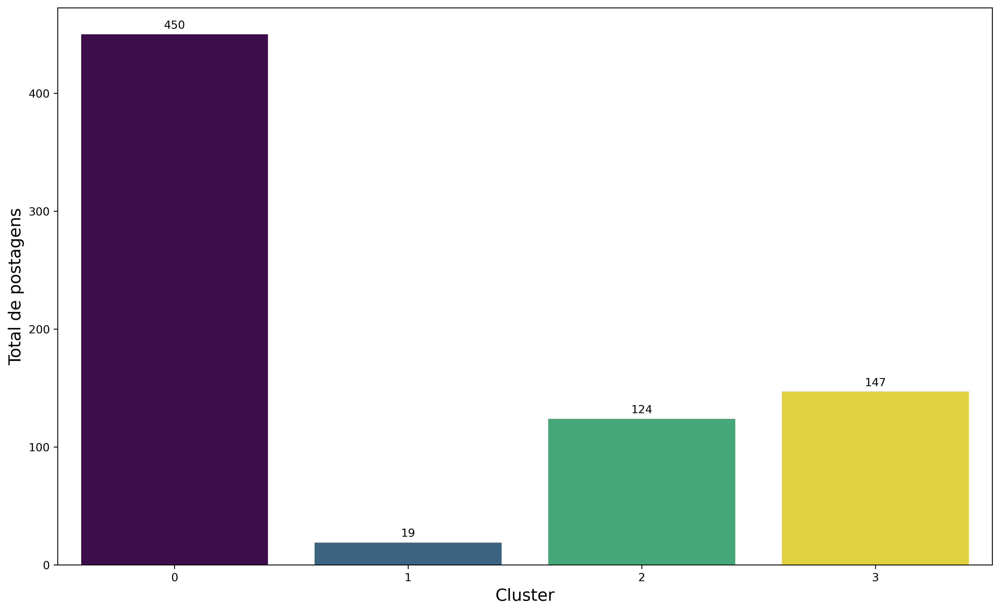

In [13]:
# %% VETOR E KMEANS COMBINANDO TEXT COM PERSON

X_person = np.array(df["person"].tolist())

X_combined = hstack([X_tfidf, csr_matrix(X_person)])

elbow_method(X_combined)
text_and_person_clustering_results = perform_cluster_analysis(X_combined, 4)

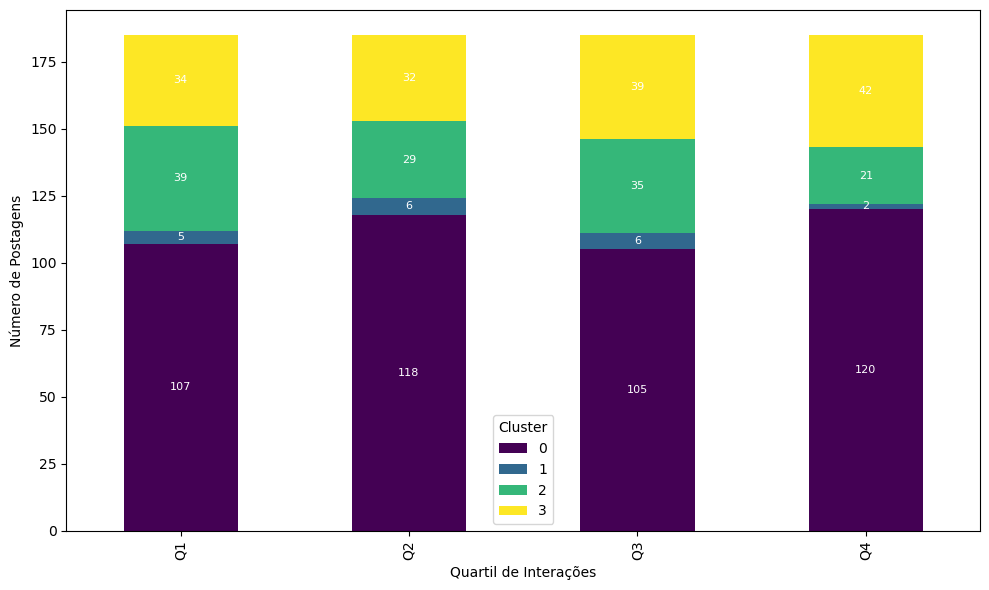

C:\Users\josee\AppData\Local\Temp\ipykernel_27672\4016251720.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="quartile", y="interactions", data=df_quartile, palette="viridis")


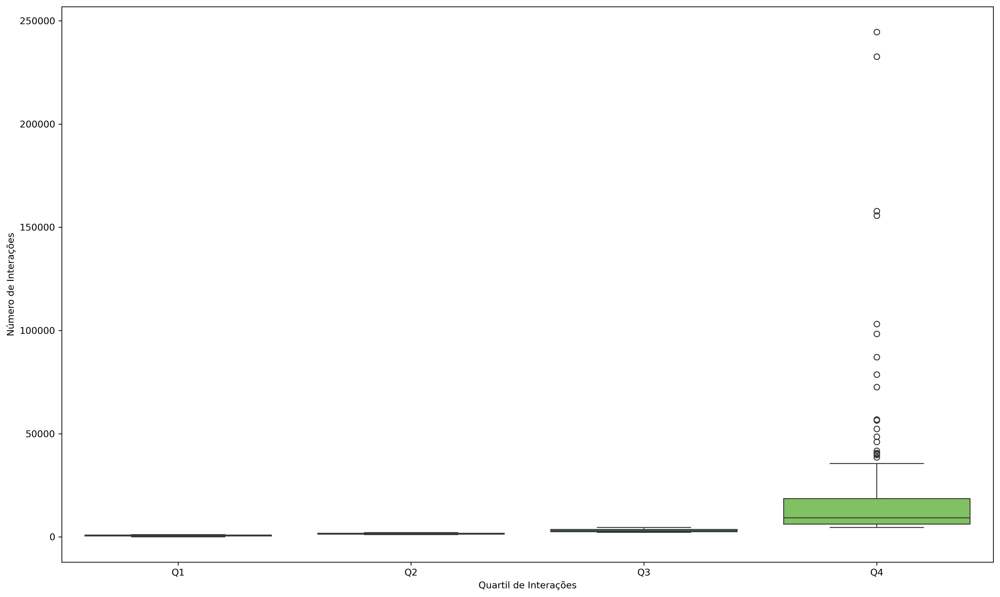

In [14]:
# %% INTERAÇÕES POR QUARTIL

def quartile():
    df_quartile = df.sort_values("interactions").reset_index(drop=True)
    df_quartile["quartile"] = pd.qcut(df_quartile.index, 4, labels=["Q1", "Q2", "Q3", "Q4"])
    cluster_quartile_counts = pd.crosstab(df_quartile["cluster"], df_quartile["quartile"])
    
    quartile_cluster_counts = cluster_quartile_counts.T  # agora index = quartis
    ax = quartile_cluster_counts.plot(
        kind="bar",
        stacked=True,
        figsize=(10, 6),
        colormap="viridis"
    )
    plt.xlabel("Quartil de Interações")
    plt.ylabel("Número de Postagens")
    plt.legend(title="Cluster")

    for container in ax.containers:
        ax.bar_label(container, label_type="center", fontsize=8, color="white")
    
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(15,9), dpi=300)
    sns.boxplot(x="quartile", y="interactions", data=df_quartile, palette="viridis")
    plt.xlabel("Quartil de Interações")
    plt.ylabel("Número de Interações")
    plt.tight_layout()
    plt.show()
    
    return df_quartile
    
df_quartile = quartile()